# High Value Customer Identification (Insiders)

## 0.0. Planejamento da Solução

### Input - Entrada

1. Problema de Negócio
   - Selecionar os clientes mais valiosos para integrar um programa de Fidelização

--------------------------------------------------------------     
2. Conjunto de dados
   - Vendas de um e-commerce online, durante o periodo de um ano.

### Output - Saída

1. A indicação das pessoas que farão parte do programa de Insiders
    - Lista: client_id | is_insider |
    -          10323    | yes / 1
    -          32413    | no / 2

---------------------------------------------------------------
2. Relatório com as respostas das perguntas de negócio
    - Quem são as pessoas elegíveis para participar do programa de Insiders?
    - Quantos clientes farão parte do grupo?
    - Quais as principais características desses clientes?
    - Qual a porcentagem de contribuição do faturamento, vinda do Insiders?
    - Qual a expectativa de faturamento desse grupo para os próximos meses?
    - Quais as condições para uma pessoa ser elegível ao Insiders?
    - Quais as condições para uma pessoa ser removida do Insiders?
    - Qual a garantia que o programa Insiders é melhor que o restante da base?
    - Quais ações o time de marketing pode realizar para aumentar o faturamento?

### Task - Tarefas

1. Quem são as pessoas elegíveis para participar do programa de Insiders?
    - O que é ser elegível? O que são clientes de maior 'valor'?
        - Faturamento:
          - Alto Ticket médio.
          - Alto LTV.
          - Baixo Recência. (Sempre esta comprando ou utilizando o produto)
          - Alto Basket Size.
          - Baixo probabilidade de Churn.
          - Alta previsão de LTV.
          - Alta propensão de compra.

        - Custo:
          - Baixa taxa de devolução.

        - Experiência de compra:
          - Média alta das avaliação.

------------------------------------------------------
2. Quantos clientes farão parte do grupo?
    - Número total de clientes.
    - % do grupo Insiders.

------------------------------------------------------
3. Quais as principais características desses clientes?
    - Escrever características do cliente:
        - Idade.
        - Localização.
        - Sexo.
        - Estado Cívil.

    - Escrever características do consumo:
        - Atributos da clusterização.

------------------------------------------------------
4. Qual a porcentagem de contribuição do faturamento, vinda do Insiders?
    - Faturamento total do ano.
    - Faturamento do grupo Insiders.

------------------------------------------------------
5. Qual a expectativa de faturamento desse grupo para os próximos meses?
    - LTV do grupo Insiders.
    - Análise de Cohort

------------------------------------------------------
6. Quais as condições para uma pessoa ser elegível ao Insiders?
    - Definir a periodicidade. 
    - A pessoa precisa ser similar ou parecido com uma pessoa do grupo.

------------------------------------------------------
7. Quais as condições para uma pessoa ser removida do Insiders?
    - Definir a periodicidade.
    - A pessoa precisa ser desimilar ou não-parecido com uma pessoa do grupo

------------------------------------------------------
8. Qual a garantia que o programa Insiders é melhor que o restante da base?
    - Teste A/B.
    - Teste A/B Bayesiano
    - Teste de hipóteses.

------------------------------------------------------
9. Quais ações o time de marketing pode realizar para aumentar o faturamento?
    - Desconto.
    - Preferência de compra.
    - Produtos exclusivos.
    - Visita a empresa.

# <font color='blue'>0.0. Imports</font>

In [143]:
import numpy    as np
import pandas   as pd
import seaborn  as sns
import inflection
import warnings

import umap.umap_ as umap

from matplotlib import pyplot as plt
from IPython.display import HTML
from plotly import express as px

from pandas_profiling import ProfileReport

from sklearn import cluster as c
from sklearn import metrics as m
from sklearn import preprocessing as pp
from sklearn import decomposition as dd

from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

warnings.filterwarnings( 'ignore' )

## <font color='blue'>0.1. Helper Functions</font>

In [80]:
def jupyter_settings():
    %matplotlib inline
    %pylab inline
    
    plt.style.use( 'ggplot')
    plt.rcParams['figure.figsize'] = [24, 9]
    plt.rcParams['font.size'] = 24
    
    display( HTML( '<style>.container { width:100% !important; }</style>') )
    pd.options.display.max_columns = None
    pd.options.display.max_rows = None
    pd.set_option( 'display.expand_frame_repr', False )
    
    sns.set()
    
jupyter_settings()

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


## <font color='blue'>0.2. Load DataSet</font>

In [81]:
# load data
df_raw = pd.read_csv('../data/raw/Ecommerce.csv', encoding='unicode_escape')

# drop extra column
df_raw = df_raw.drop( columns=['Unnamed: 8'], axis=1)

In [82]:
df_raw.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,29-Nov-16,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,29-Nov-16,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,29-Nov-16,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,29-Nov-16,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,29-Nov-16,3.39,17850.0,United Kingdom


# <font color='red'>1.0. Descrição dos dados</font>

In [83]:
df1 = df_raw.copy()

## 1.1. Rename Columns

In [84]:
df1.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country'],
      dtype='object')

In [85]:
cols_old = ['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country']

snakecase = lambda x: inflection.underscore( x )

cols_new = list( map (snakecase, cols_old) )

#Rename
df1.columns = cols_new

In [86]:
df1.columns

Index(['invoice_no', 'stock_code', 'description', 'quantity', 'invoice_date',
       'unit_price', 'customer_id', 'country'],
      dtype='object')

## 1.2. Data Dimensions

In [87]:
print(f'Numero de Linhas: {df1.shape[0]}')
print(f'Numero de Colunas: {df1.shape[1]}')

Numero de Linhas: 541909
Numero de Colunas: 8


## 1.3. Data Types

In [88]:
df1.head()

,invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,29-Nov-16,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,29-Nov-16,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,29-Nov-16,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,29-Nov-16,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,29-Nov-16,3.39,17850.0,United Kingdom


In [89]:
df1.dtypes

invoice_no       object
stock_code       object
description      object
quantity          int64
invoice_date     object
unit_price      float64
customer_id     float64
country          object
dtype: object

## 1.4. Check NA

In [90]:
df1.isna().sum()

invoice_no           0
stock_code           0
description       1454
quantity             0
invoice_date         0
unit_price           0
customer_id     135080
country              0
dtype: int64

## 1.5. Replace NA

In [91]:
df_missing = df1.loc[df1['customer_id'].isna(), :]
df_not_missing = df1.loc[~df1['customer_id'].isna(), :]

In [92]:
print(f'Customer NA: {df_missing.shape[0]}')
print(f'Customer Ok: {df_not_missing.shape[0]}')

Customer NA: 135080
Customer Ok: 406829


In [93]:
# Separando em uma lista os invoice sem o customer registrado
missing_invoice = df_missing['invoice_no'].drop_duplicates().tolist()
missing_invoice[0:10]

['536414',
 '536544',
 '536545',
 '536546',
 '536547',
 '536549',
 '536550',
 '536552',
 '536553',
 '536554']

In [94]:
# Conferindo se algum invoice que o customer não está registrado, consta no dataframe com os customer ok
df_not_missing.loc[df_not_missing['invoice_no'].isin( missing_invoice ),:].head()

,invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country


**Conclusão:** Não temos invoice repetido na base onde um tenha o customer id e outro não. Dessa forma não conseguimos preencher os NA's com essa estratégia.

In [95]:
# Criar id's acima do valor maximo do customer id, para conseguir usar os 25% da base que está como NA na clusterização

# create reference
df_backup = pd.DataFrame( df_missing['invoice_no'].drop_duplicates() )
df_backup['customer_id'] = np.arange(19000, 19000 + len( df_backup ), 1 )

# merge original with reference dataframe
df1 = pd.merge( df1, df_backup, on='invoice_no', how='left')

# coalese
df1['customer_id'] = df1['customer_id_x'].combine_first( df1['customer_id_y'] )

# drop extra columns
df1 = df1.drop( columns=['customer_id_x', 'customer_id_y'], axis=1 )

In [96]:
df1.isna().sum()

invoice_no         0
stock_code         0
description     1454
quantity           0
invoice_date       0
unit_price         0
country            0
customer_id        0
dtype: int64

## 1.6. Change Dtypes

In [97]:
df1.dtypes

invoice_no       object
stock_code       object
description      object
quantity          int64
invoice_date     object
unit_price      float64
country          object
customer_id     float64
dtype: object

In [98]:
# invoice_date
df1['invoice_date'] = pd.to_datetime( df1['invoice_date'], format='%d-%b-%y' )

# customer_id
df1['customer_id'] =df1['customer_id'].astype( int ) 

df1.head()

,invoice_no,stock_code,description,quantity,invoice_date,unit_price,country,customer_id
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2016-11-29,2.55,United Kingdom,17850
1,536365,71053,WHITE METAL LANTERN,6,2016-11-29,3.39,United Kingdom,17850
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2016-11-29,2.75,United Kingdom,17850
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2016-11-29,3.39,United Kingdom,17850
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2016-11-29,3.39,United Kingdom,17850


In [99]:
df1.dtypes

invoice_no              object
stock_code              object
description             object
quantity                 int64
invoice_date    datetime64[ns]
unit_price             float64
country                 object
customer_id              int64
dtype: object

## 1.7. Descriptive Statistics

In [100]:
num_attributes = df1.select_dtypes( include=['int64', 'float64'] )
cat_attributes = df1.select_dtypes( exclude=['int64', 'float64', 'datetime64[ns]'] )


### 1.7.1 Numerical Attributes

In [101]:
# central tendency - mean, median
ct1 = pd.DataFrame( num_attributes.apply( np.mean ) ).T
ct2 = pd.DataFrame( num_attributes.apply( np.median ) ).T

# dispersion - desvio padrão, minímo, maximo, range, skew, kurtosis
d1 = pd.DataFrame( num_attributes.apply( np.std ) ).T
d2 = pd.DataFrame( num_attributes.apply( np.min ) ).T
d3 = pd.DataFrame( num_attributes.apply( np.max ) ).T
d4 = pd.DataFrame( num_attributes.apply( lambda x: x.max() - x.min()  ) ).T
d5 = pd.DataFrame( num_attributes.apply( lambda x: x.skew() ) ).T
d6 = pd.DataFrame( num_attributes.apply( lambda x: x.kurtosis() ) ).T

# concatenate
m = pd.concat( [d2, d3, d4, ct1, ct2, d1, d5, d6]).T.reset_index()
m.columns=['attributes','Min', 'Max', 'Range', 'Mean', 'Mediana', 'Desvio Padrão', 'Skew', 'Kurtosis']
m

,attributes,Min,Max,Range,Mean,Mediana,Desvio Padrão,Skew,Kurtosis
0,quantity,-80995.00,80995.0,161990.00,9.552250,3.00,218.080957,-0.264076,119769.160031
1,unit_price,-11062.06,38970.0,50032.06,4.611114,2.08,96.759764,186.506972,59005.719097
2,customer_id,12346.00,22709.0,10363.00,16688.840453,16249.00,2911.408666,0.487449,-0.804287


### <font color='red'> 1.7.1.1 Numerical Attributes - Investigação</font>

1. Quantity Negativa ( pode ser devolução )
2. Preço unitário (unit_price) igaul a zero ( promoção? )

### 1.7.2 Categorical Attributes

#### Invoice No

In [102]:
# prblema: temos invoice com letras e números

# identificação:
df_letter_invoce = df1.loc[df1['invoice_no'].apply( lambda x: bool( re.search( '[^0-9]+', x) ) ), : ]
df_letter_invoce.head()

# qt invoice com letras
print(f'Total de invoice com letras: {len(df_letter_invoce)}')

# qt de linhas com a coluna 'quantity' negativa
print(f'Total de linhas com a quantity negativa: {len( df_letter_invoce[df_letter_invoce["quantity"] < 0 ] )}')

Total de invoice com letras: 9291
Total de linhas com a quantity negativa: 9288


#### Stock Code

In [103]:
# prblema: temos Stock Code com letras e números

# identificação:tock_code - apenas strings
df1.loc[df1['stock_code'].apply( lambda x: bool( re.search( '^[a-zA-Z]+$', x) ) ), 'stock_code'].unique()

# Remover stock_code in ['POST', 'D', 'M', 'PADS', 'DOT', 'CRUK']

array(['POST', 'D', 'DOT', 'M', 'S', 'AMAZONFEE', 'm', 'DCGSSBOY',
       'DCGSSGIRL', 'PADS', 'B', 'CRUK'], dtype=object)

#### Description

In [104]:
df1.head()

# Deletar a coluna description

,invoice_no,stock_code,description,quantity,invoice_date,unit_price,country,customer_id
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2016-11-29,2.55,United Kingdom,17850
1,536365,71053,WHITE METAL LANTERN,6,2016-11-29,3.39,United Kingdom,17850
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2016-11-29,2.75,United Kingdom,17850
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2016-11-29,3.39,United Kingdom,17850
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2016-11-29,3.39,United Kingdom,17850


#### Country

In [105]:
# Paises únicos na base
df1['country'].unique()

array(['United Kingdom', 'France', 'Australia', 'Netherlands', 'Germany',
       'Norway', 'EIRE', 'Switzerland', 'Spain', 'Poland', 'Portugal',
       'Italy', 'Belgium', 'Lithuania', 'Japan', 'Iceland',
       'Channel Islands', 'Denmark', 'Cyprus', 'Sweden', 'Austria',
       'Israel', 'Finland', 'Bahrain', 'Greece', 'Hong Kong', 'Singapore',
       'Lebanon', 'United Arab Emirates', 'Saudi Arabia',
       'Czech Republic', 'Canada', 'Unspecified', 'Brazil', 'USA',
       'European Community', 'Malta', 'RSA'], dtype=object)

In [106]:
# % de paises na base
df1['country'].value_counts(normalize=True).head()

country
United Kingdom    0.914320
Germany           0.017521
France            0.015790
EIRE              0.015124
Spain             0.004674
Name: proportion, dtype: float64

In [107]:
# Qt customer por pais
df1[['customer_id', 'country']].drop_duplicates().groupby( 'country' ).count().reset_index().sort_values( 'customer_id', ascending=False ).head()

,country,customer_id
36,United Kingdom,7587
14,Germany,95
13,France,90
10,EIRE,44
31,Spain,31


# <font color='red'>2.0. Filtragem de Variáveis</font>

In [108]:
df2 = df1.copy()

In [109]:
df2.dtypes

invoice_no              object
stock_code              object
description             object
quantity                 int64
invoice_date    datetime64[ns]
unit_price             float64
country                 object
customer_id              int64
dtype: object

In [110]:
# ==== Numerical Attributes ====
# unit price > 0.0
df2 = df2.loc[df2['unit_price'] > 0.04, :]

# === Categorical Attributes ====
# stock code != ['POST', 'D', 'DOT', 'M', 'S', 'AMAZONFEE', 'm', 'DCGSSBOY', 'DCGSSGIRL', 'PADS', 'B', 'CRUK']
df2 = df2[~df2['stock_code'].isin(['POST', 'D', 'DOT', 'M', 'S', 'AMAZONFEE', 'm', 'DCGSSBOY', 'DCGSSGIRL', 'PADS', 'B', 'CRUK'] )]

# description
df2 = df2.drop( columns='description', axis=1 )

# country - exclusão das linhas (RISCO)
df2 = df2 [~df2['country'].isin ( ['European Community', 'Unspecified' ] ) ]


# quantity - Negative number (devolução de produto) - Efetuado a separação do dataframe entre os produtos vendidos e os devolvidos
df2_returns = df2.loc[df2['quantity'] < 0, :]
df2_purchase = df2.loc[df2['quantity'] > 0, :]


# <font color='red'>3.0. Feature Engineering</font>

In [111]:
df3 = df2.copy()

## 3.1. Feature Creation

In [112]:
df3.head()

,invoice_no,stock_code,quantity,invoice_date,unit_price,country,customer_id
0,536365,85123A,6,2016-11-29,2.55,United Kingdom,17850
1,536365,71053,6,2016-11-29,3.39,United Kingdom,17850
2,536365,84406B,8,2016-11-29,2.75,United Kingdom,17850
3,536365,84029G,6,2016-11-29,3.39,United Kingdom,17850
4,536365,84029E,6,2016-11-29,3.39,United Kingdom,17850


In [113]:
# data reference
df_ref = df3.drop( ['invoice_no', 'stock_code', 'quantity', 'invoice_date', 'unit_price', 
                    'country'], axis=1 ).drop_duplicates( ignore_index=True)

### 3.1.1. Gross Revenue

In [114]:
# Gross Revenue (Faturamento) quantity * price
df2_purchase['gross_revenue'] = df2_purchase['quantity'] * df2_purchase['unit_price']

# Monetary
df_monetary = df2_purchase[['customer_id', 'gross_revenue']].groupby('customer_id').sum().reset_index()
df_ref = pd.merge( df_ref, df_monetary, on='customer_id', how='left')
df_ref.isna().sum()

customer_id       0
gross_revenue    91
dtype: int64

### 3.1.2. Recency - Day from last purchase

In [115]:
# Recency - ultimo dia de compra
df_recency = df2_purchase[['customer_id', 'invoice_date']].groupby('customer_id').max().reset_index()
df_recency['recency_days'] = ( df2_purchase['invoice_date'].max() - df_recency['invoice_date'] ).dt.days
df_recency = df_recency[['customer_id', 'recency_days']].copy()
df_ref = pd.merge( df_ref, df_recency, on='customer_id', how='left')
df_ref.isna().sum()

customer_id       0
gross_revenue    91
recency_days     91
dtype: int64

### 3.1.3. Quantity of purchased

In [116]:
# Numero de produtos
df_freq = (df2_purchase[['customer_id', 'invoice_no']].drop_duplicates()
                                                      .groupby('customer_id')
                                                      .count()
                                                      .reset_index()
                                                      .rename( columns={'invoice_no': 'qte_invoices'}))
df_ref = pd.merge( df_ref, df_freq, on='customer_id', how='left')
df_ref.isna().sum()

customer_id       0
gross_revenue    91
recency_days     91
qte_invoices     91
dtype: int64

### 3.1.4. Quantity of items purchased

In [117]:
# Numero de produtos
df_freq_prod = (df2_purchase[['customer_id', 'quantity']].groupby('customer_id')
                                                         .sum()
                                                         .reset_index()
                                                         .rename( columns={'quantity': 'qte_items'}) )
df_ref = pd.merge( df_ref, df_freq_prod, on='customer_id', how='left')
df_ref.isna().sum()

customer_id       0
gross_revenue    91
recency_days     91
qte_invoices     91
qte_items        91
dtype: int64

### 3.1.5. Quantity of produtcs purchased

In [118]:
# Numero de produtos
df_freq_prod = (df2_purchase[['customer_id', 'stock_code']].groupby('customer_id')
                                                           .count()
                                                           .reset_index()
                                                           .rename( columns={'stock_code': 'qtde_produtcs'}) )
df_ref = pd.merge( df_ref, df_freq_prod, on='customer_id', how='left')
df_ref.isna().sum()

customer_id       0
gross_revenue    91
recency_days     91
qte_invoices     91
qte_items        91
qtde_produtcs    91
dtype: int64

### 3.1.6. Average Ticket Value

In [119]:
# AVG Ticket
df_avg_ticket = df2_purchase[['customer_id', 'gross_revenue']].groupby('customer_id').mean().reset_index().rename( columns={'gross_revenue': 'avg_ticket'})
df_ref = pd.merge( df_ref, df_avg_ticket, on='customer_id', how='left')
df_ref.isna().sum()

customer_id       0
gross_revenue    91
recency_days     91
qte_invoices     91
qte_items        91
qtde_produtcs    91
avg_ticket       91
dtype: int64

### 3.1.7. Average Recency Days

In [120]:
# Average recency days
df_aux = df2_purchase[['customer_id', 'invoice_date']].drop_duplicates().sort_values( ['customer_id', 'invoice_date'], ascending=[True , True] )
df_aux['next_customer_id'] = df_aux['customer_id'].shift() # next customer
df_aux['previous_date'] = df_aux['invoice_date'].shift() # next invoince date

df_aux['avg_recency_days'] = df_aux.apply( lambda x: ( x['invoice_date'] - x['previous_date'] ).days if x['customer_id'] == x['next_customer_id'] else np.nan, axis=1 )

df_aux = df_aux.drop( ['invoice_date', 'next_customer_id', 'previous_date'], axis=1 ).dropna()

# averagerecency
df_avg_recency_days = df_aux.groupby('customer_id' ).mean().reset_index()

# merge
df_ref = pd.merge( df_ref, df_avg_recency_days, on='customer_id', how='left')
df_ref.isna().sum()

customer_id            0
gross_revenue         91
recency_days          91
qte_invoices          91
qte_items             91
qtde_produtcs         91
avg_ticket            91
avg_recency_days    3013
dtype: int64

### 3.1.8. Frequency Purchase

In [121]:
df_aux = ( df2_purchase[['invoice_no', 'customer_id', 'invoice_date']].drop_duplicates()
                                                             .groupby( 'customer_id')
                                                             .agg( max_ = ('invoice_date', 'max'),
                                                                   min_ = ('invoice_date', 'min'),
                                                                   days_= ('invoice_date', lambda x: ( (x.max() - x.min() ).days ) +1 ),
                                                                   buy_ = ( 'invoice_no', 'count')) ).reset_index()
         
# Frequency
df_aux['frequency'] = df_aux[['buy_', 'days_']].apply( lambda x: x['buy_'] / x['days_'] if x['days_'] != 0 else 0, axis=1)

# merge
df_ref = pd.merge( df_ref, df_aux[['customer_id', 'frequency']], on='customer_id', how='left')
df_ref.isna().sum()

customer_id            0
gross_revenue         91
recency_days          91
qte_invoices          91
qte_items             91
qtde_produtcs         91
avg_ticket            91
avg_recency_days    3013
frequency             91
dtype: int64

### 3.1.9. Devoluções

In [122]:
# Number of Returns
df_returns = df2_returns[['customer_id', 'quantity']].groupby( 'customer_id' ).sum().reset_index().rename( columns={'quantity':'qtde_returns'} )
df_returns['qtde_returns'] = df_returns['qtde_returns'] * -1

df_ref = pd.merge( df_ref, df_returns, how='left', on='customer_id' )
df_ref.loc[df_ref['qtde_returns'].isna(), 'qtde_returns'] = 0

df_ref.isna().sum()

customer_id            0
gross_revenue         91
recency_days          91
qte_invoices          91
qte_items             91
qtde_produtcs         91
avg_ticket            91
avg_recency_days    3013
frequency             91
qtde_returns           0
dtype: int64

### 3.1.10. Basket Size - Quantidade de Items por Cesta (Quantity)

In [123]:
df_aux = ( df2_purchase.loc[:,['customer_id', 'invoice_no', 'quantity']].groupby( 'customer_id')
                                                                        .agg( n_purchase=( 'invoice_no', 'nunique'),
                                                                              n_products=( 'quantity', 'sum'))
                                                                        .reset_index() )

# calculation
df_aux['avg_basket_size'] = df_aux['n_products'] / df_aux['n_purchase']

# merge
df_ref = pd.merge( df_ref, df_aux[['customer_id', 'avg_basket_size']], on='customer_id', how='left')
df_ref.isna().sum()

customer_id            0
gross_revenue         91
recency_days          91
qte_invoices          91
qte_items             91
qtde_produtcs         91
avg_ticket            91
avg_recency_days    3013
frequency             91
qtde_returns           0
avg_basket_size       91
dtype: int64

### 3.1.11. Unique Basket Size - Quantidade de Produtos distintos por compra

In [124]:
df_aux = ( df2_purchase.loc[:,['customer_id', 'invoice_no', 'stock_code']].groupby( 'customer_id')
                                                                          .agg( n_purchase=( 'invoice_no', 'nunique'),
                                                                                n_products=( 'stock_code', 'nunique'))
                                                                          .reset_index() )

# calculation
df_aux['avg_unique_basket_size'] = df_aux['n_products'] / df_aux['n_purchase']

# merge
df_ref = pd.merge( df_ref, df_aux[['customer_id', 'avg_unique_basket_size']], on='customer_id', how='left')
df_ref.isna().sum()

customer_id                  0
gross_revenue               91
recency_days                91
qte_invoices                91
qte_items                   91
qtde_produtcs               91
avg_ticket                  91
avg_recency_days          3013
frequency                   91
qtde_returns                 0
avg_basket_size             91
avg_unique_basket_size      91
dtype: int64

In [125]:
df_ref.head()

,customer_id,gross_revenue,recency_days,qte_invoices,qte_items,qtde_produtcs,avg_ticket,avg_recency_days,frequency,qtde_returns,avg_basket_size,avg_unique_basket_size
0,17850,5391.21,372.0,34.0,1733.0,297.0,18.152222,1.000000,17.000000,40.0,50.970588,0.617647
1,13047,3232.59,56.0,9.0,1390.0,171.0,18.904035,52.833333,0.028302,35.0,154.444444,11.666667
2,12583,6705.38,2.0,15.0,5028.0,232.0,28.902500,26.500000,0.040323,50.0,335.200000,7.600000
3,13748,948.25,95.0,5.0,439.0,28.0,33.866071,92.666667,0.017921,0.0,87.800000,4.800000
4,15100,876.00,333.0,3.0,80.0,3.0,292.000000,20.000000,0.073171,22.0,26.666667,0.333333


# <font color='red'>4.0. EDA (Exploratory Data Analysis)</font>

In [126]:
df4 = df_ref.dropna()
df4.isna().sum()

customer_id               0
gross_revenue             0
recency_days              0
qte_invoices              0
qte_items                 0
qtde_produtcs             0
avg_ticket                0
avg_recency_days          0
frequency                 0
qtde_returns              0
avg_basket_size           0
avg_unique_basket_size    0
dtype: int64

## 4.1. Univariate Analysis

**Anotações**
1. Clusters Coesos - Separados
2. Métricas
    - Min, Max, Range (Dispersão)
    - Média e Mediana
    - Desvio Padrão e Variância
    - Coeficiente de Variação (Desvio-padrão / média)

**Anotações**


In [66]:
profile = ProfileReport ( df4 )
profile.to_file ( 'output.html' )

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████████████████████████████████████| 12/12 [00:00<00:00, 514.96it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### 4.1.1. Gross Revenue

In [127]:
df4.sort_values( 'gross_revenue', ascending=False ).head(5)

,customer_id,gross_revenue,recency_days,qte_invoices,qte_items,qtde_produtcs,avg_ticket,avg_recency_days,frequency,qtde_returns,avg_basket_size,avg_unique_basket_size
1017,14646,279138.02,1.0,72.0,196844.0,2060.0,135.503893,8.022727,0.203390,288.0,2733.944444,9.708333
492,18102,259657.30,0.0,60.0,64124.0,431.0,602.453132,14.680000,0.163043,0.0,1068.733333,2.500000
433,17450,194550.79,8.0,46.0,69993.0,337.0,577.302047,13.807692,0.127778,952.0,1521.586957,2.695652
3338,16446,168472.50,0.0,2.0,80997.0,3.0,56157.500000,205.000000,0.009709,80995.0,40498.500000,1.500000
66,14911,140438.72,1.0,199.0,79963.0,5670.0,24.768734,2.861538,0.533512,3332.0,401.824121,8.969849


### 4.1.2. Qtde Items

In [128]:
df3[df3['customer_id'] == 14646].head()

,invoice_no,stock_code,quantity,invoice_date,unit_price,country,customer_id
37952,539491,21981,12,2016-12-18,0.29,Netherlands,14646
37953,539491,21986,12,2016-12-18,0.29,Netherlands,14646
37954,539491,22720,2,2016-12-18,4.95,Netherlands,14646
37955,539491,21931,1,2016-12-18,1.95,Netherlands,14646
37956,539491,22613,2,2016-12-18,0.85,Netherlands,14646


### 4.1.3. Qtde Products

In [129]:
df4[df4['qtde_produtcs'] == 7837]

,customer_id,gross_revenue,recency_days,qte_invoices,qte_items,qtde_produtcs,avg_ticket,avg_recency_days,frequency,qtde_returns,avg_basket_size,avg_unique_basket_size
68,17841,40959.72,1.0,124.0,22853.0,7837.0,5.226454,3.351351,0.33244,203.0,184.298387,10.653226


### 4.1.4. Avg Ticket

In [130]:
df4[df4['avg_ticket'] == 56157.5]

,customer_id,gross_revenue,recency_days,qte_invoices,qte_items,qtde_produtcs,avg_ticket,avg_recency_days,frequency,qtde_returns,avg_basket_size,avg_unique_basket_size
3338,16446,168472.5,0.0,2.0,80997.0,3.0,56157.5,205.0,0.009709,80995.0,40498.5,1.5


In [131]:
df3[df3['customer_id'] == 16446].head()

,invoice_no,stock_code,quantity,invoice_date,unit_price,country,customer_id
194354,553573,22980,1,2017-05-16,1.65,United Kingdom,16446
194355,553573,22982,1,2017-05-16,1.25,United Kingdom,16446
540421,581483,23843,80995,2017-12-07,2.08,United Kingdom,16446
540422,C581484,23843,-80995,2017-12-07,2.08,United Kingdom,16446


## 4.2. Bivariate Analysis

In [132]:
df42 = df4.drop( 'customer_id', axis=1 )
df42.head()

,gross_revenue,recency_days,qte_invoices,qte_items,qtde_produtcs,avg_ticket,avg_recency_days,frequency,qtde_returns,avg_basket_size,avg_unique_basket_size
0,5391.21,372.0,34.0,1733.0,297.0,18.152222,1.000000,17.000000,40.0,50.970588,0.617647
1,3232.59,56.0,9.0,1390.0,171.0,18.904035,52.833333,0.028302,35.0,154.444444,11.666667
2,6705.38,2.0,15.0,5028.0,232.0,28.902500,26.500000,0.040323,50.0,335.200000,7.600000
3,948.25,95.0,5.0,439.0,28.0,33.866071,92.666667,0.017921,0.0,87.800000,4.800000
4,876.00,333.0,3.0,80.0,3.0,292.000000,20.000000,0.073171,22.0,26.666667,0.333333


<Figure size 2500x1200 with 0 Axes>

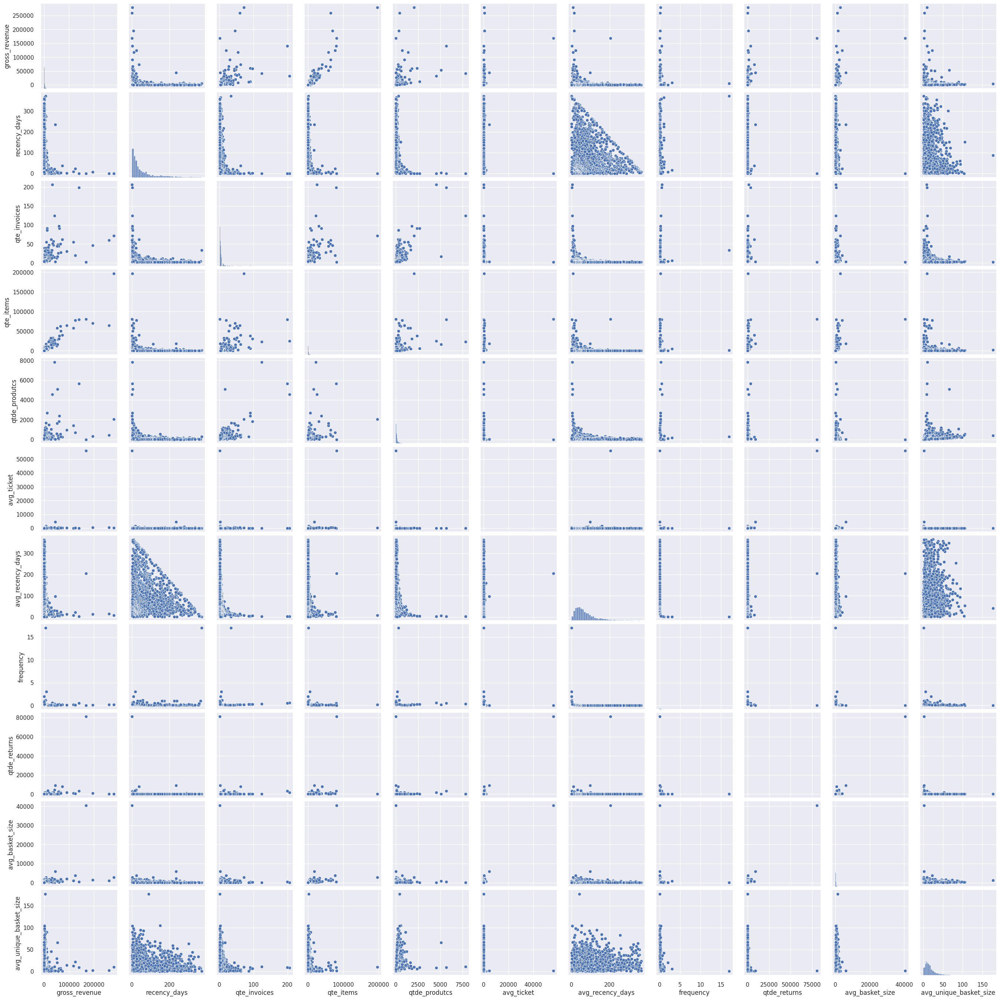

In [135]:
plt.figure( figsize=(25,12) )
sns.pairplot(df42)

## 4.3. Estudo do Espaço

In [140]:
df43 = df4.drop( columns=['customer_id'], axis=1 ).copy()

In [141]:
df43.columns

Index(['gross_revenue', 'recency_days', 'qte_invoices', 'qte_items',
       'qtde_produtcs', 'avg_ticket', 'avg_recency_days', 'frequency',
       'qtde_returns', 'avg_basket_size', 'avg_unique_basket_size'],
      dtype='object')

In [142]:
mm = pp.MinMaxScaler()

#
df43['gross_revenue'] = mm.fit_transform( df43[['gross_revenue']] )
df43['recency_days'] = mm.fit_transform( df43[['recency_days']] )
df43['qte_invoices'] = mm.fit_transform( df43[['qte_invoices']] )
df43['qte_items'] = mm.fit_transform( df43[['qte_items']] )
df43['qtde_produtcs'] = mm.fit_transform( df43[['qtde_produtcs']] )
df43['avg_ticket'] = mm.fit_transform( df43[['avg_ticket']] )
df43['avg_recency_days'] = mm.fit_transform( df43[['avg_recency_days']] )
df43['frequency'] = mm.fit_transform( df43[['frequency']] )
df43['qtde_returns'] = mm.fit_transform( df43[['qtde_returns']] )
df43['avg_basket_size'] = mm.fit_transform( df43[['avg_basket_size']] )
df43['avg_unique_basket_size'] = mm.fit_transform( df43[['avg_unique_basket_size']] )

X = df43.copy()

### 4.3.1. PCA

<BarContainer object of 11 artists>

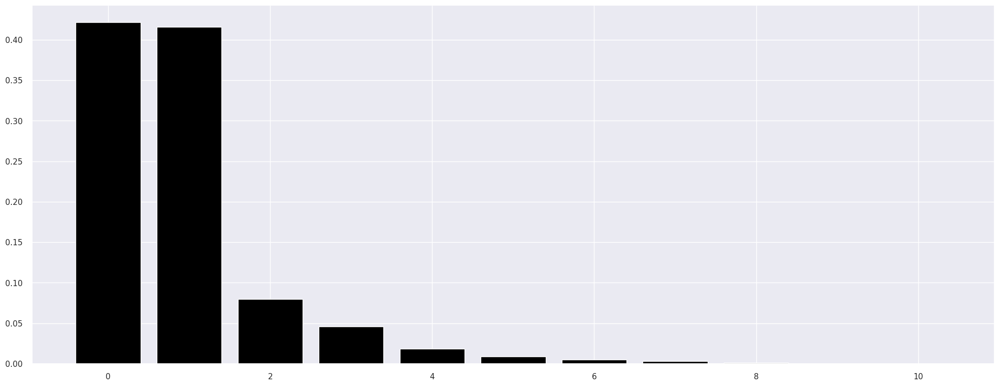

In [144]:
pca = dd.PCA ( n_components= X.shape[1] )

principal_components = pca.fit_transform ( X )

#plot Explained variable
features = range( pca.n_components_ )

plt.bar( features, pca.explained_variance_ratio_, color='black')

### 4.3.2. UMAP

### 4.3.3. t-SNE

### 4.3.4. Tree-Based Embedding

# <font color='red'>5.0. Data Preparation</font>

In [76]:
df5 = df4.copy()

In [77]:
df5.head()

,customer_id,gross_revenue,recency_days,invoice_no,avg_ticket,returns
0,17850,5391.21,372.0,34.0,18.152222,1.0
1,13047,3232.59,56.0,9.0,18.904035,7.0
2,12583,6705.38,2.0,15.0,28.902500,2.0
3,13748,948.25,95.0,5.0,33.866071,0.0
4,15100,876.00,333.0,3.0,292.000000,3.0


In [78]:
ss = pp.StandardScaler()

df5['gross_revenue'] = ss.fit_transform( df5[['gross_revenue']])
df5['recency_days'] = ss.fit_transform( df5[['recency_days']])
df5['invoice_no'] = ss.fit_transform( df5[['invoice_no']])
df5['avg_ticket'] = ss.fit_transform( df5[['avg_ticket']])
df5['returns'] = ss.fit_transform( df5[['returns']])

# <font color='red'>6.0. Feature Selection</font>

In [79]:
df6 = df5.copy()

# <font color='red'>7.0. Hyperparameter Fine-Tunning</font>

In [80]:
X = df6.drop( columns=['customer_id'])

In [81]:
X.head()

,gross_revenue,recency_days,invoice_no,avg_ticket,returns
0,0.377193,2.791512,3.889210,-0.033939,0.114690
1,0.135388,-0.361004,0.620928,-0.033427,3.158261
2,0.524404,-0.899726,1.405316,-0.026622,0.621952
3,-0.120499,0.028072,0.098003,-0.023244,-0.392571
4,-0.128592,2.402435,-0.163459,0.152443,1.129214


In [82]:
clusters = [2, 3, 4, 5, 6, 7]

## 7.1. Within-Cluster Sum of Square (WSS)

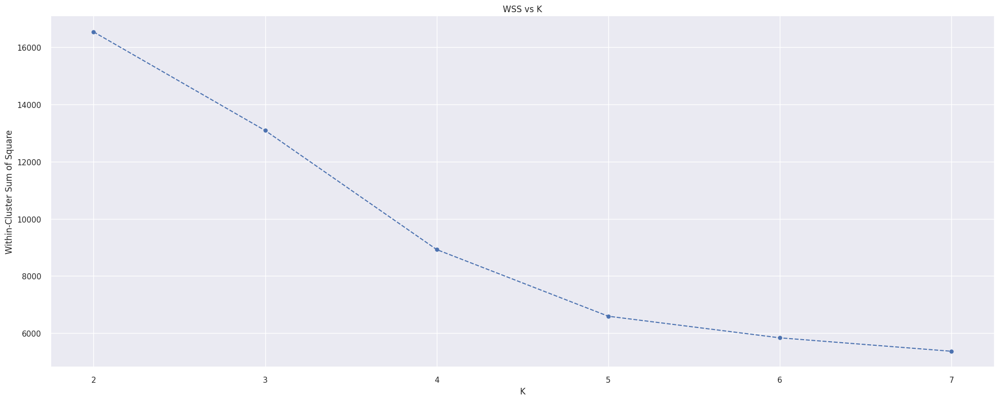

In [83]:
wss = []
for k in clusters:
    # model definition
    kmeans = c.KMeans( init='random', n_clusters=k, n_init=10, max_iter=300, random_state=42 )
    
    # model training
    kmeans.fit( X )
    
    # validation
    wss.append( kmeans.inertia_ )

# plot wss - Elbow Method
plt.plot( clusters, wss, linestyle='--', marker='o', color='b' )
plt.xlabel( 'K' );
plt.ylabel( 'Within-Cluster Sum of Square' );
plt.title( 'WSS vs K' );

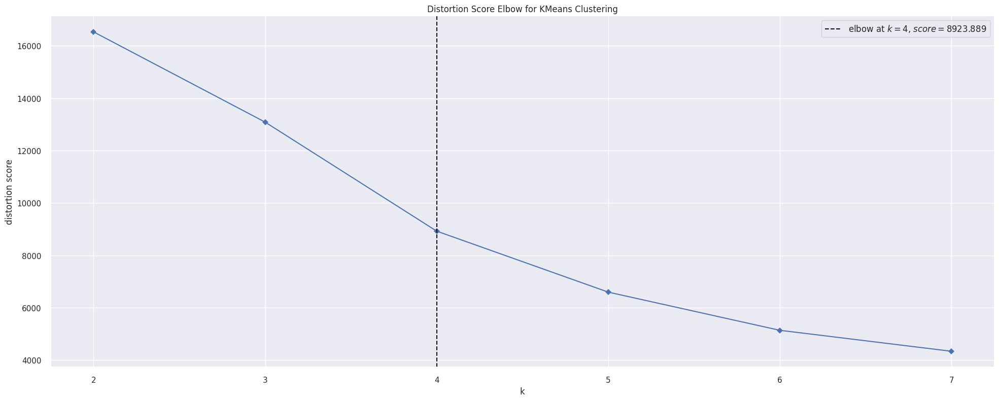

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [84]:
kmeans = KElbowVisualizer( c.KMeans(), k=clusters, timings=False)
kmeans.fit( X )
kmeans.show()

## 7.2. Sillhouette Score

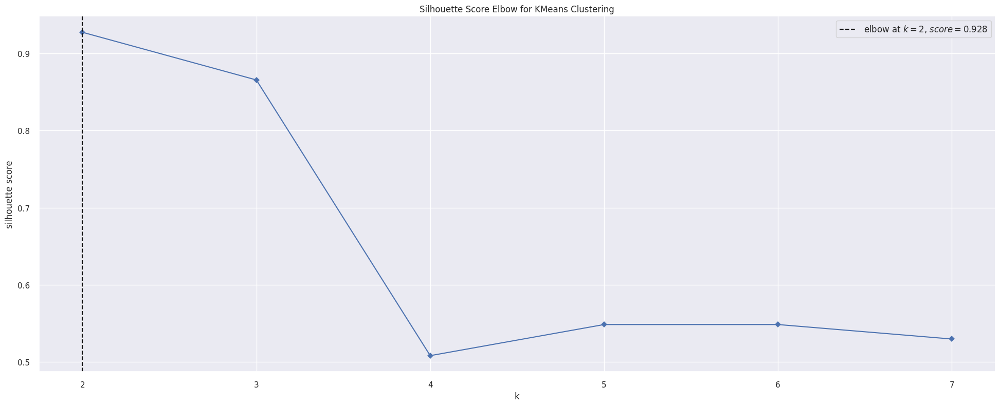

<Axes: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [85]:
kmeans = KElbowVisualizer( c.KMeans(), k=clusters, metric='silhouette', timings=False)
kmeans.fit( X )
kmeans.show()

### 7.2.1. Sillhouette Analysis

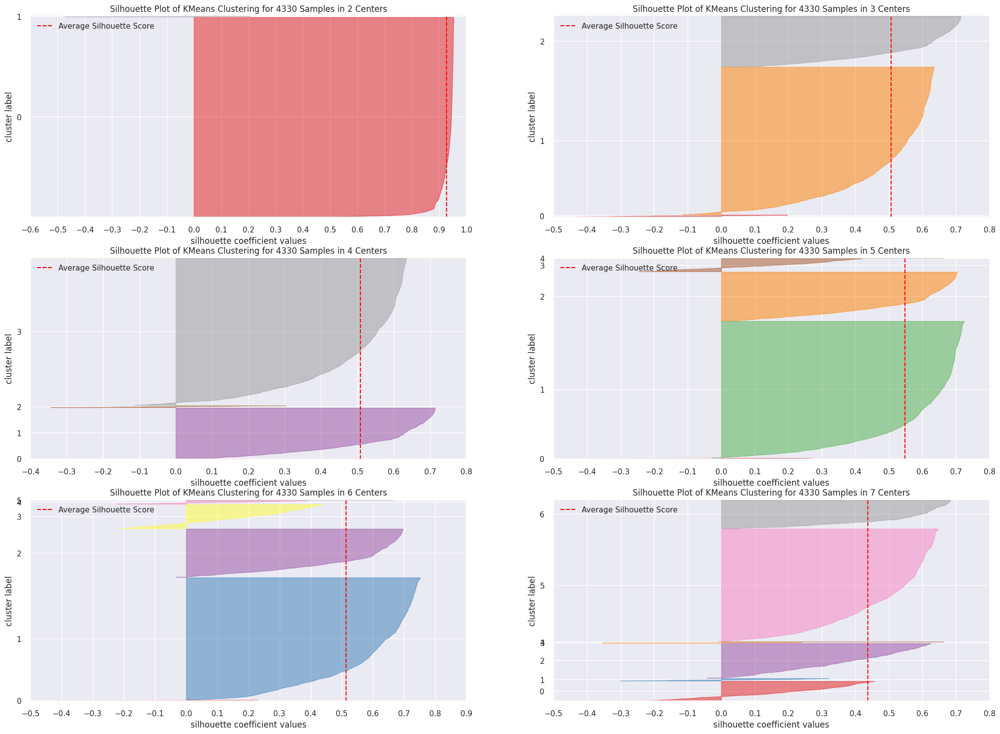

In [86]:
fig, ax = plt.subplots(3, 2, figsize=(25, 18) )

for k in clusters:
    km = c.KMeans( n_clusters=k, init='random', n_init=10, max_iter=100, random_state=42)
    q, mod = divmod( k, 2)
    visualizer = SilhouetteVisualizer( km, color='yellowbrik', ax=ax[q-1][mod] )
    visualizer.fit( X );
    visualizer.finalize()

# <font color='red'>8.0. Model Training</font>

## 8.1. K-Means

In [87]:
# model definition
k = 3
kmeans = c.KMeans( init='random', n_clusters=k, n_init=10, max_iter=300, random_state=42 )

# model training
kmeans.fit( X )

# clustering
labels = kmeans.labels_

### 8.1.0. Cluster Validation

In [88]:
# WSS (Within-Cluster Sum of Square)
print( f'WSS value: {kmeans.inertia_}')

# SS (Silhouette Score)
print( f'SS value: {m.silhouette_score( X, labels, metric="euclidean" )}' )

WSS value: 13085.440009771159
SS value: 0.5060641637777309


# <font color='red'>9.0. Cluster Analysis</font>

In [89]:
df9 = df6.copy()
df9['cluster'] = labels
df9.head()

,customer_id,gross_revenue,recency_days,invoice_no,avg_ticket,returns,cluster
0,17850,0.377193,2.791512,3.889210,-0.033939,0.114690,2
1,13047,0.135388,-0.361004,0.620928,-0.033427,3.158261,1
2,12583,0.524404,-0.899726,1.405316,-0.026622,0.621952,1
3,13748,-0.120499,0.028072,0.098003,-0.023244,-0.392571,1
4,15100,-0.128592,2.402435,-0.163459,0.152443,1.129214,2


## 9.1. Visualization Inspection

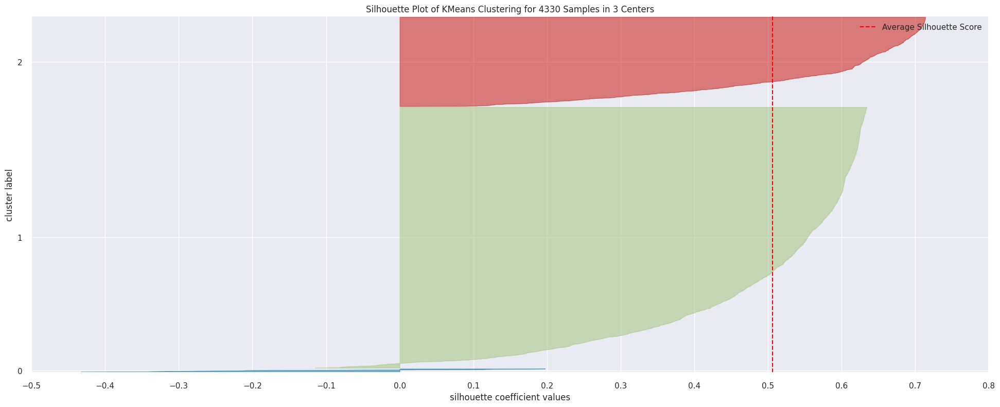

In [90]:
visualizer = SilhouetteVisualizer( kmeans, colors='yellowbrick' )
visualizer.fit( X )
visualizer.finalize()

### 9.1.1 2d plot

In [91]:
df9.head()

,customer_id,gross_revenue,recency_days,invoice_no,avg_ticket,returns,cluster
0,17850,0.377193,2.791512,3.889210,-0.033939,0.114690,2
1,13047,0.135388,-0.361004,0.620928,-0.033427,3.158261,1
2,12583,0.524404,-0.899726,1.405316,-0.026622,0.621952,1
3,13748,-0.120499,0.028072,0.098003,-0.023244,-0.392571,1
4,15100,-0.128592,2.402435,-0.163459,0.152443,1.129214,2


In [92]:
#df_viz = df9.drop( columns='customer_id', axis=1 )
#sns.pairplot( df_viz, hue='cluster' )

### 9.1.2 UMAP

<Axes: xlabel='embedding_x', ylabel='embedding_y'>

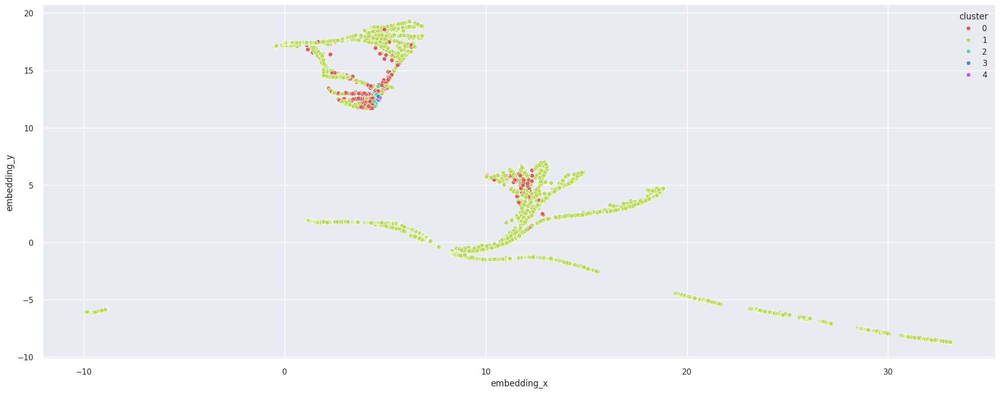

In [97]:
reducer = umap.UMAP( n_neighbors=90, random_state=42 )
embedding = reducer.fit_transform( X )

# embedding
df_viz['embedding_x'] = embedding[:, 0]
df_viz['embedding_y'] = embedding[:, 1]

#plot
sns.scatterplot( x='embedding_x', y='embedding_y',
               hue='cluster', palette=sns.color_palette( 'hls', n_colors=len(df_viz['cluster'].unique()) ),
               data=df_viz)

## 9.1. Visualization Inspection

In [36]:
# Visualização para até 3 dimenções
#fig = px.scatter_3d( df9, x='recency_days', y='invoice_no', z='gross_revenue', color='cluster' )
#fig.show()

## 9.2. Cluster Profile

In [98]:
df9.head()

,customer_id,gross_revenue,recency_days,invoice_no,avg_ticket,returns,cluster
0,17850,0.377193,2.791512,3.889210,-0.033939,0.114690,2
1,13047,0.135388,-0.361004,0.620928,-0.033427,3.158261,1
2,12583,0.524404,-0.899726,1.405316,-0.026622,0.621952,1
3,13748,-0.120499,0.028072,0.098003,-0.023244,-0.392571,1
4,15100,-0.128592,2.402435,-0.163459,0.152443,1.129214,2


In [99]:
# Number of customer
df_cluster = df9[['customer_id', 'cluster']].groupby( 'cluster' ).count().reset_index()
df_cluster['perc_customer'] = 100 * ( df_cluster['customer_id'] / df_cluster['customer_id'].sum() )

# AVG gross_revenue
df_avg_gross_revenue = df9[['gross_revenue', 'cluster']].groupby ('cluster').mean().reset_index()
df_cluster = pd.merge( df_cluster, df_avg_gross_revenue, how='inner', on='cluster')

# AVG recency_days
df_avg_recency_days = df9[['recency_days', 'cluster']].groupby ('cluster').mean().reset_index()
df_cluster = pd.merge( df_cluster, df_avg_recency_days, how='inner', on='cluster')

# AVG invoice_no
df_avg_invoice_no = df9[['invoice_no', 'cluster']].groupby ('cluster').mean().reset_index()
df_cluster = pd.merge( df_cluster, df_avg_invoice_no, how='inner', on='cluster')

# Avg Ticket
df_tcket = df9[['avg_ticket', 'cluster']].groupby ('cluster').mean().reset_index()
df_cluster = pd.merge( df_cluster, df_tcket, how='inner', on='cluster')

df_cluster

,cluster,customer_id,perc_customer,gross_revenue,recency_days,invoice_no,avg_ticket
0,0,40,0.923788,6.686153,-0.794725,6.500568,2.308955
1,1,3196,73.810624,-0.027185,-0.513661,0.039019,-0.025920
2,2,1094,25.265589,-0.165049,1.529663,-0.351669,-0.008701


### Cluster 01:
    - Número de customers: 6 (0,14% do custormers)
    - Recência em média: 7 dias
    - Compra em média: 89 compras
    - Ticket em média: $253,63 dolares
- Receita em média: $182.181,98 dolares

### Cluster 02:
    - Número de customers: 28 (0,64% do custormers)
    - Recência em média: 6 dias
    - Compra em média: 58 compras
    - Ticket em média: $162,86 dolares
- Receita em média: $42.614,39 dolares

### Cluster 03:
    - Número de customers: 267 (6% do custormers)
    - Recência em média: 20 dias
    - Compra em média: 19 compras
    - Ticket em média: $62,78 dolares
- Receita em média: $8.089,03 dolares

### Cluster 04:
    - Número de customers: 4.071 (93% do custormers)
    - Recência em média: 96 dias
    - Compra em média: 3 compras
    - Ticket em média: $25,36 dolares
- Receita em média: $946,70 dolares

# <font color='red'>10.0. Deploy To Production</font>